# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [24]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    # return torch.normal(mean=torch.zeros((n_samples,z_dim), device=device), std=torch.ones((n_samples,z_dim), device=device) )
    return torch.randn( (n_samples,z_dim), device=device )
    #### END CODE HERE ####

In [25]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [26]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2)
        #### END CODE HERE ####
    )

In [27]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [28]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)   
            # do not need a sigmoid after the output layer since `sigmoid` will be included in the loss function.
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [29]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [30]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [31]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [36]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device=device)
    fake_imgs = gen(noise).detach() # to ensure that only the discriminator is updated! 
    predics_fake = disc(fake_imgs)
    loss_fake = criterion( predics_fake , torch.zeros_like( predics_fake ) )
    None
    predics_real = disc(real)
    loss_real = criterion( predics_real , torch.ones_like( predics_real ) )
    disc_loss = (torch.mean(loss_fake) + torch.mean(loss_real))/2
    #### END CODE HERE ####
    return disc_loss

In [37]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [44]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device=device)
    fake_imgs = gen(noise)
    predics_fake = disc(fake_imgs)
    gen_loss = criterion( predics_fake , torch.ones_like( predics_fake ) )
    #### END CODE HERE ####
    return gen_loss

In [45]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.4564261471033098, discriminator loss: 0.4154212862849235


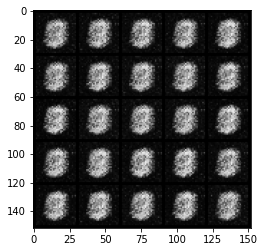

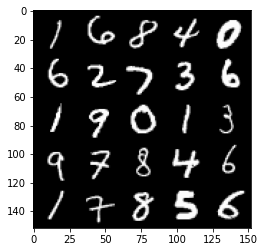

Step 1000: Generator loss: 1.8053360810279837, discriminator loss: 0.2688489302396776


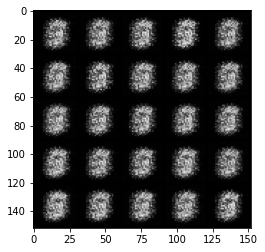

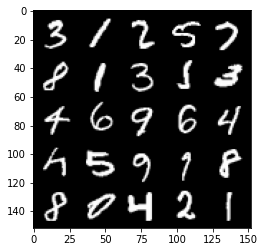

Step 1500: Generator loss: 2.1031389958858484, discriminator loss: 0.15706102281808848


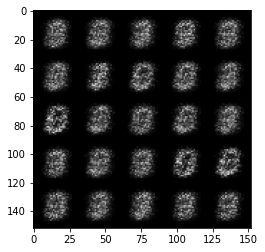

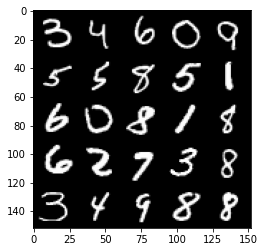

Step 2000: Generator loss: 1.7707920842170712, discriminator loss: 0.20910102814435952


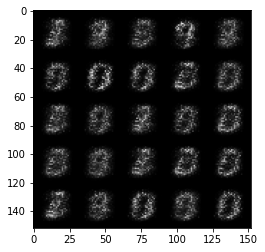

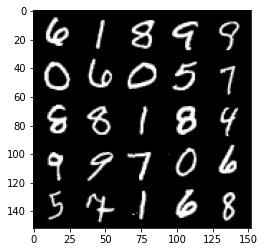

Step 2500: Generator loss: 1.821376939773559, discriminator loss: 0.1770636717081072


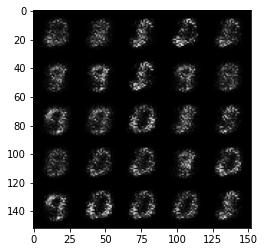

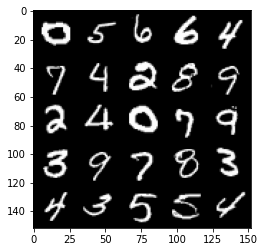

Step 3000: Generator loss: 2.1189333317279817, discriminator loss: 0.13879254531860336


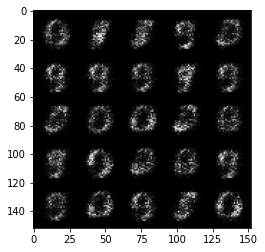

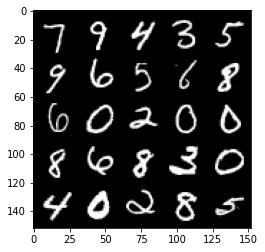

Step 3500: Generator loss: 2.4126509819030746, discriminator loss: 0.13979189226031286


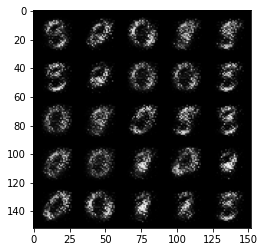

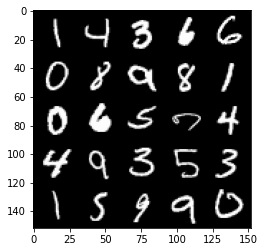

Step 4000: Generator loss: 2.6315189166069026, discriminator loss: 0.14229848365485656


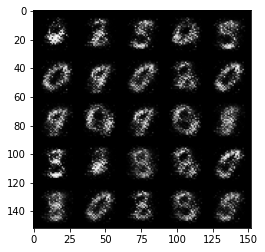

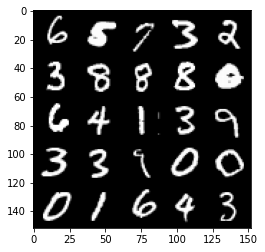

Step 4500: Generator loss: 3.0714649381637575, discriminator loss: 0.10323298498243094


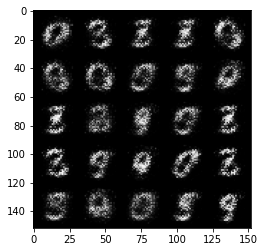

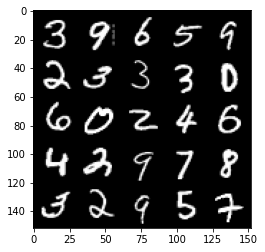

Step 5000: Generator loss: 3.482440764427184, discriminator loss: 0.07374680145084861


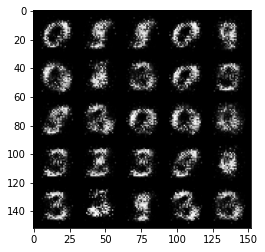

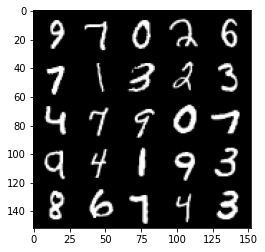

Step 5500: Generator loss: 3.8533385353088407, discriminator loss: 0.06546851093322036


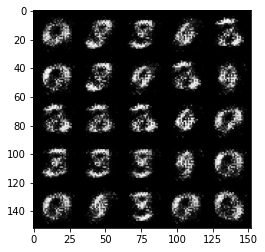

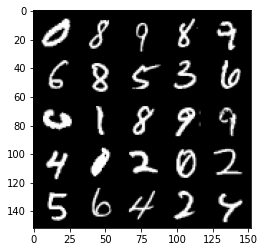

Step 6000: Generator loss: 3.9078250007629394, discriminator loss: 0.059181257866323


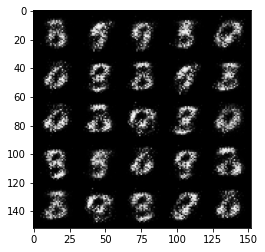

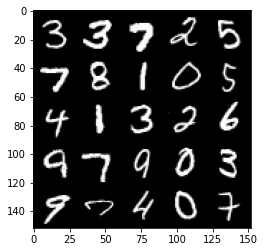

Step 6500: Generator loss: 4.02908140420914, discriminator loss: 0.06274141261726617


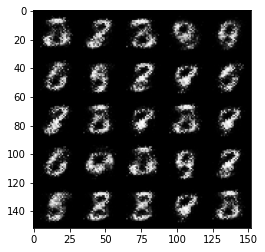

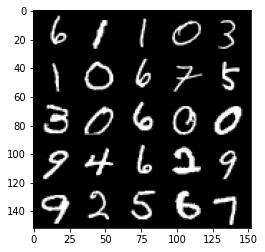

Step 7000: Generator loss: 3.8358454012870786, discriminator loss: 0.061591654464602526


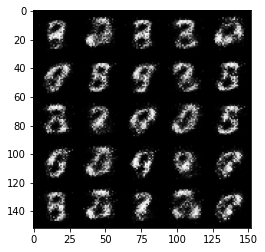

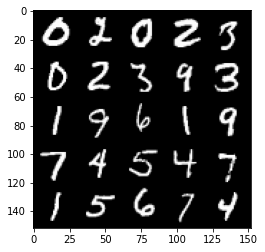

Step 7500: Generator loss: 4.228149580478666, discriminator loss: 0.048210223633796


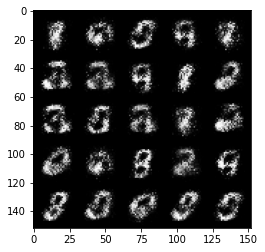

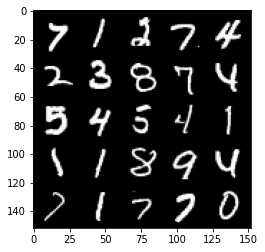

Step 8000: Generator loss: 4.3343971672058075, discriminator loss: 0.044827517610043284


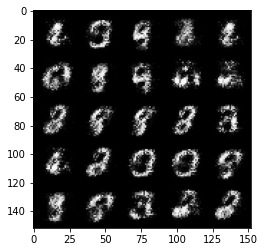

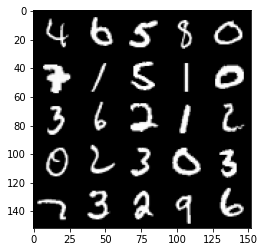

Step 8500: Generator loss: 4.3267934637069665, discriminator loss: 0.058801489923149305


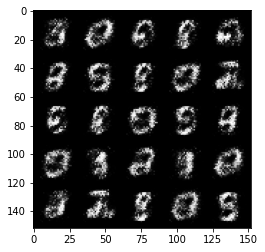

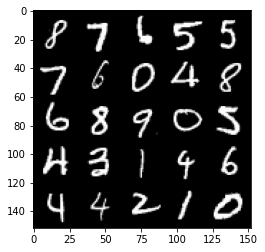

Step 9000: Generator loss: 4.394712278366092, discriminator loss: 0.04894713389128447


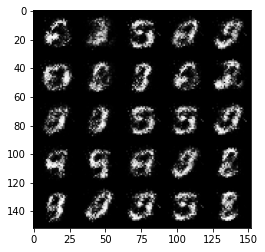

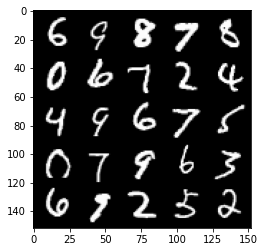

Step 9500: Generator loss: 4.527604611396788, discriminator loss: 0.049009704057127214


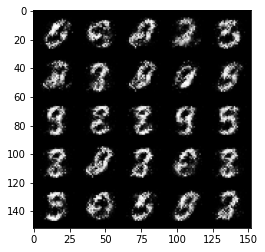

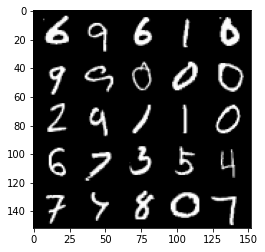

Step 10000: Generator loss: 4.398299221992497, discriminator loss: 0.05102273691073062


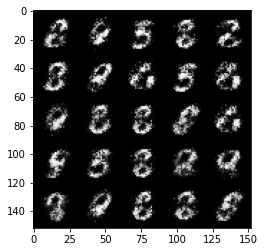

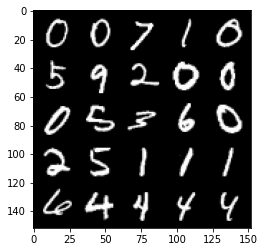

Step 10500: Generator loss: 4.255123072624205, discriminator loss: 0.06555902720987798


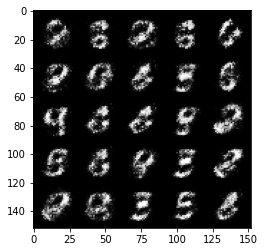

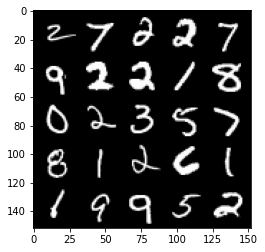

Step 11000: Generator loss: 4.2238200402259825, discriminator loss: 0.08008897362649434


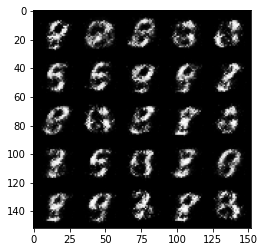

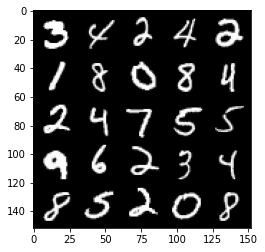

Step 11500: Generator loss: 4.270666044235229, discriminator loss: 0.071251780372113


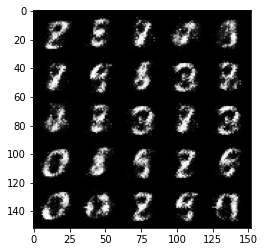

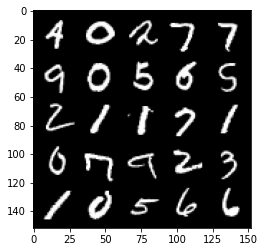

Step 12000: Generator loss: 4.220545382976536, discriminator loss: 0.06899588877707717


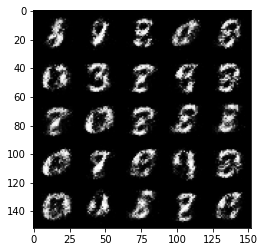

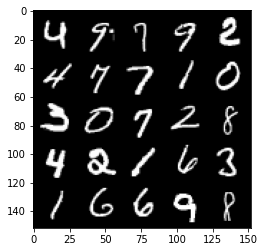

Step 12500: Generator loss: 4.304348219394688, discriminator loss: 0.07801232885569336


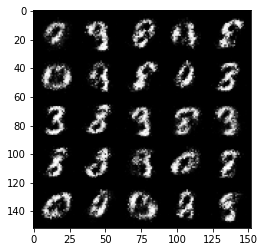

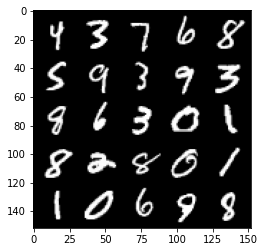

Step 13000: Generator loss: 4.240933908939364, discriminator loss: 0.07493547116965052


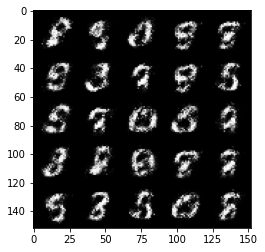

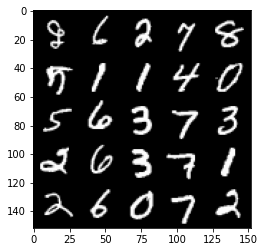

Step 13500: Generator loss: 4.236636327266693, discriminator loss: 0.08056617057323452


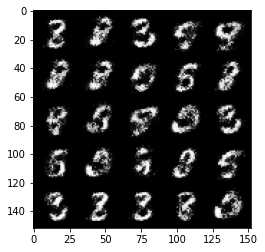

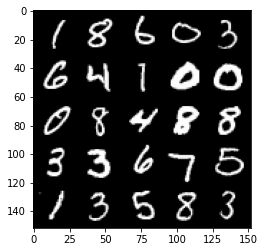

Step 14000: Generator loss: 4.175748183250422, discriminator loss: 0.08632376910746092


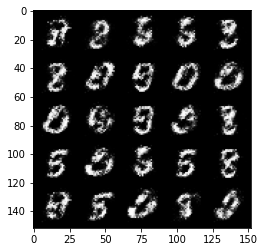

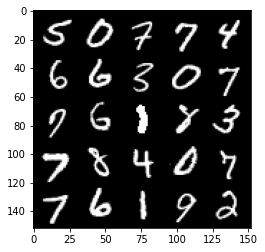

Step 14500: Generator loss: 3.9947380976676965, discriminator loss: 0.10161532987654216


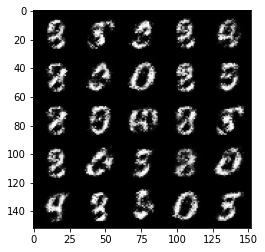

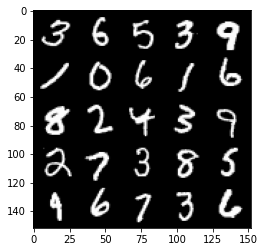

Step 15000: Generator loss: 3.9108338918685903, discriminator loss: 0.09767732141911974


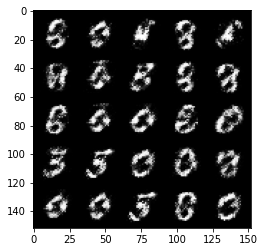

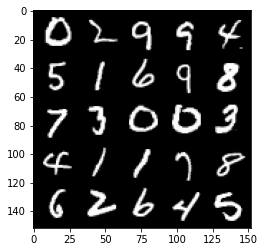

Step 15500: Generator loss: 3.971653384685518, discriminator loss: 0.11065761276334529


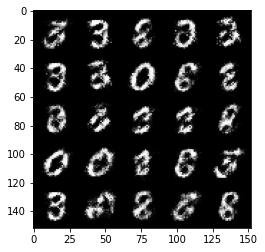

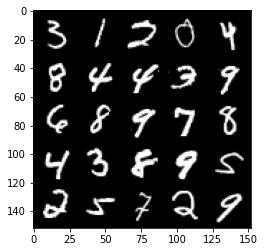

Step 16000: Generator loss: 3.754263479709626, discriminator loss: 0.10856939528137445


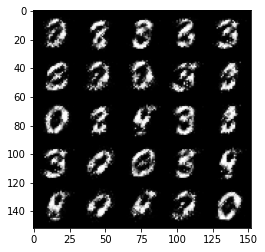

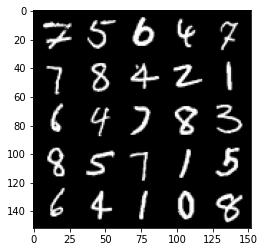

Step 16500: Generator loss: 3.7591609058380144, discriminator loss: 0.10839950324594988


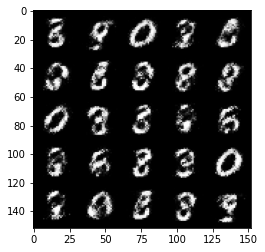

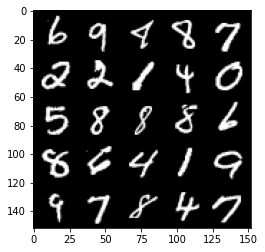

Step 17000: Generator loss: 3.553662982463836, discriminator loss: 0.13998338648676867


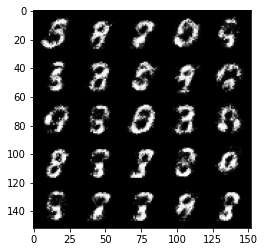

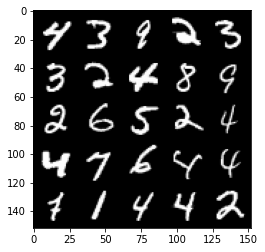

Step 17500: Generator loss: 3.417096889495849, discriminator loss: 0.14940605325996878


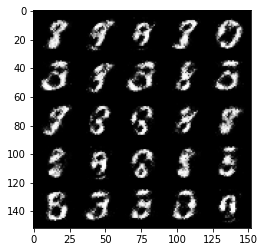

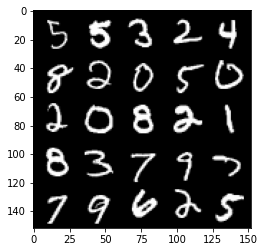

Step 18000: Generator loss: 3.5180938987731953, discriminator loss: 0.13987185883522035


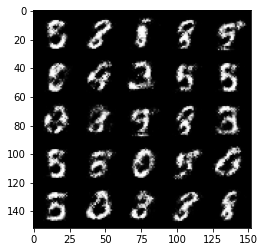

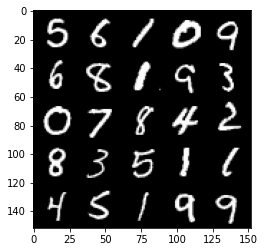

Step 18500: Generator loss: 3.5109243783950803, discriminator loss: 0.14675779241323478


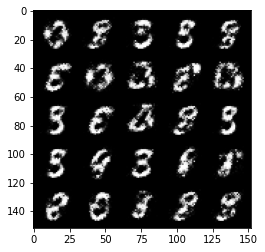

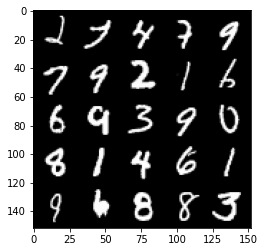

Step 19000: Generator loss: 3.3713143391609197, discriminator loss: 0.1499833662807941


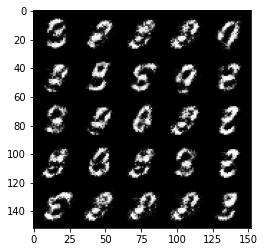

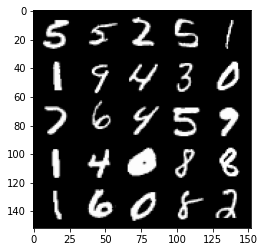

Step 19500: Generator loss: 3.52322779464722, discriminator loss: 0.14406775832176216


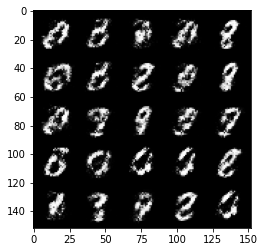

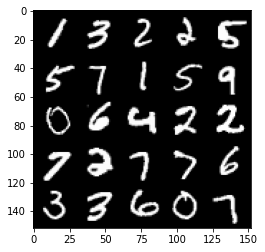

Step 20000: Generator loss: 3.4584565730094914, discriminator loss: 0.1476944672465324


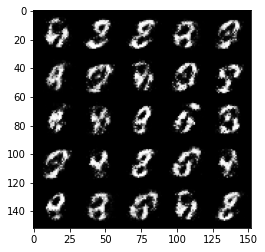

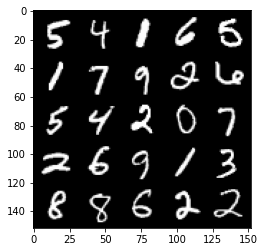

Step 20500: Generator loss: 3.4348099598884585, discriminator loss: 0.1461246316283941


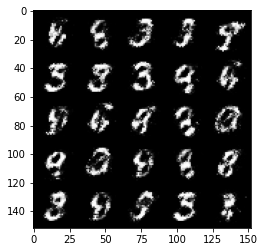

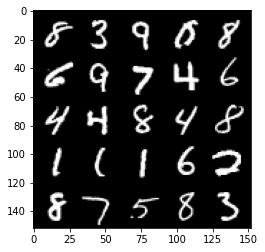

Step 21000: Generator loss: 3.509567856788635, discriminator loss: 0.14368322725594046


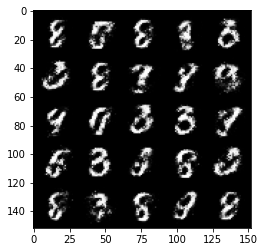

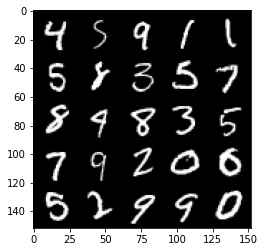

Step 21500: Generator loss: 3.212316783428191, discriminator loss: 0.17929580155014976


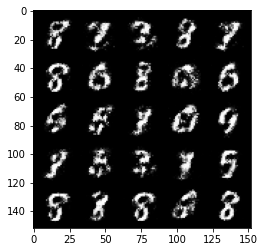

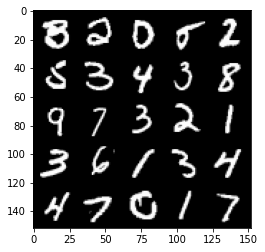

Step 22000: Generator loss: 3.1665243363380426, discriminator loss: 0.17577769359946235


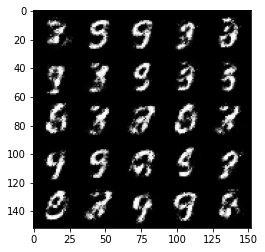

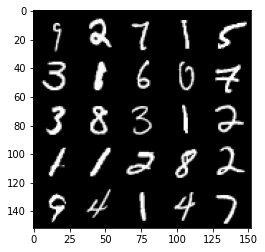

Step 22500: Generator loss: 3.030000662803651, discriminator loss: 0.1774413481354714


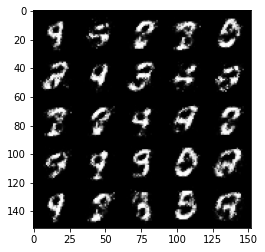

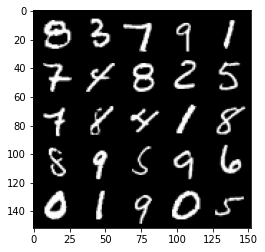

Step 23000: Generator loss: 3.190026857376099, discriminator loss: 0.1690983071178198


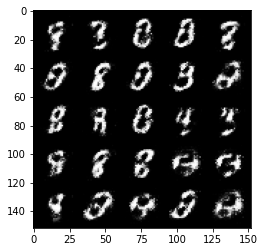

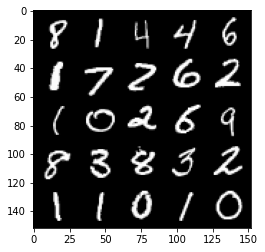

Step 23500: Generator loss: 3.1839314494132966, discriminator loss: 0.17028027555346484


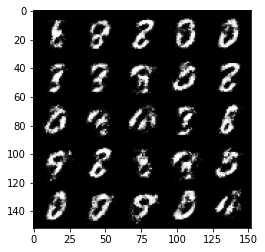

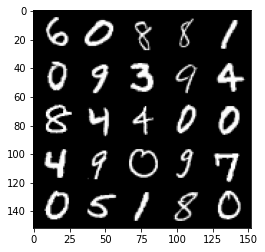

Step 24000: Generator loss: 3.094423653125761, discriminator loss: 0.17967377673089469


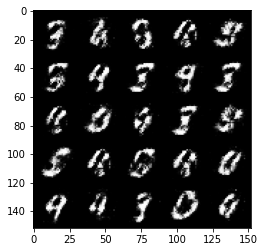

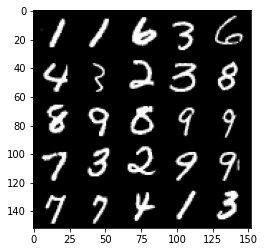

Step 24500: Generator loss: 3.2120723619461025, discriminator loss: 0.15823729449510565


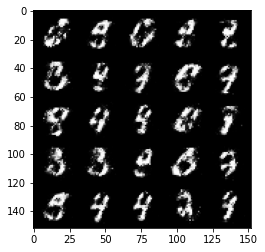

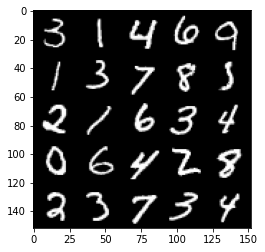

Step 25000: Generator loss: 3.196611778736117, discriminator loss: 0.18080135911703127


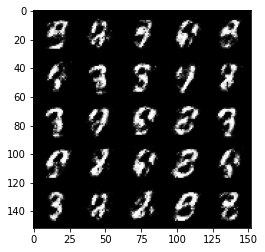

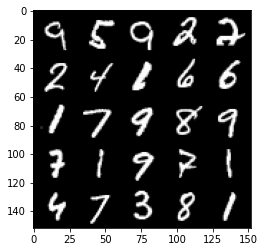

Step 25500: Generator loss: 3.0736133012771614, discriminator loss: 0.1915368150174617


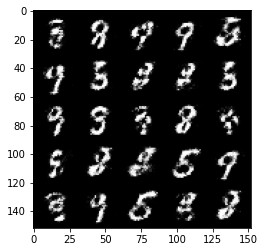

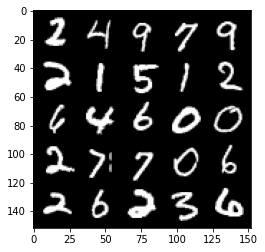

Step 26000: Generator loss: 3.0859091720581047, discriminator loss: 0.19529381906986243


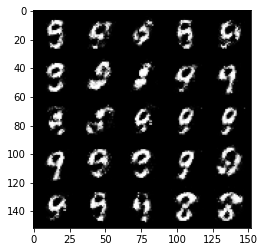

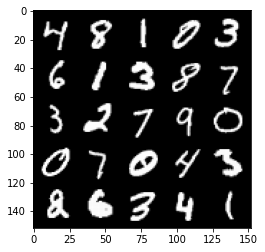

Step 26500: Generator loss: 3.030579794406892, discriminator loss: 0.18883758099377163


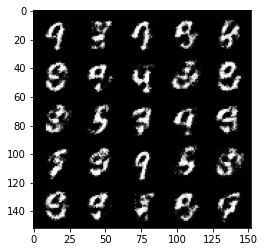

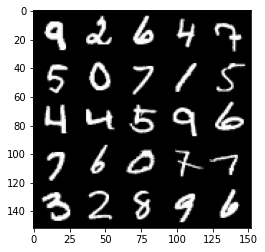

Step 27000: Generator loss: 3.0257763509750384, discriminator loss: 0.18949532182514678


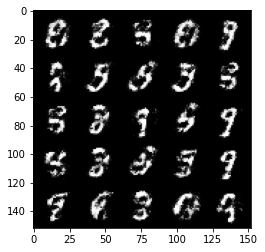

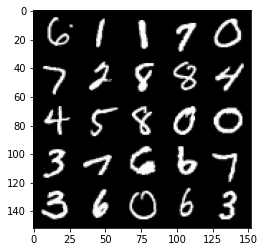

Step 27500: Generator loss: 3.0221975584030156, discriminator loss: 0.18875287230312815


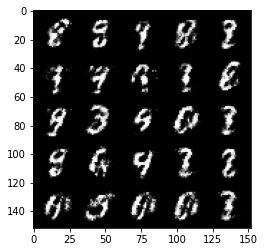

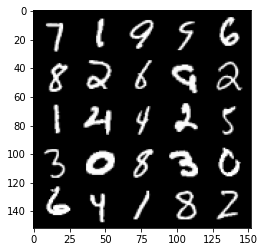

Step 28000: Generator loss: 2.8416742482185353, discriminator loss: 0.20480680921673777


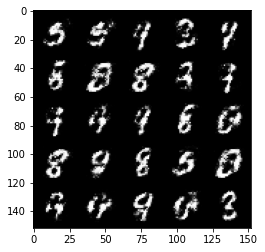

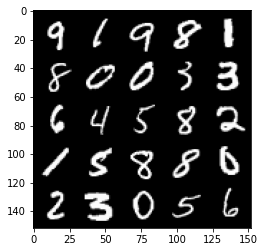

Step 28500: Generator loss: 2.929170197010039, discriminator loss: 0.18133024430274947


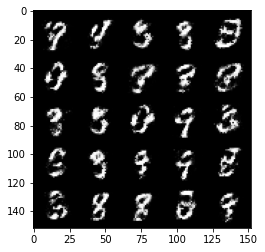

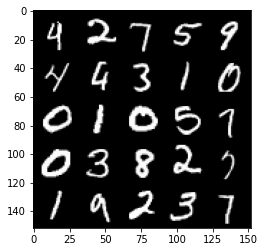

Step 29000: Generator loss: 2.929996619701385, discriminator loss: 0.20780928109586247


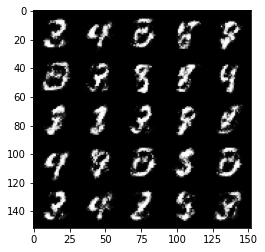

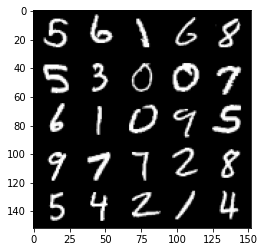

Step 29500: Generator loss: 2.9902629356384267, discriminator loss: 0.2038631906807422


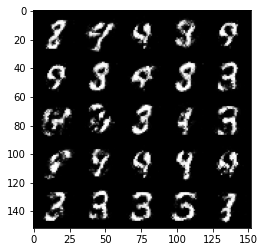

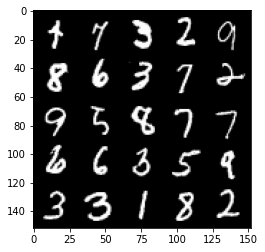

Step 30000: Generator loss: 2.841227513790131, discriminator loss: 0.2228539008498192


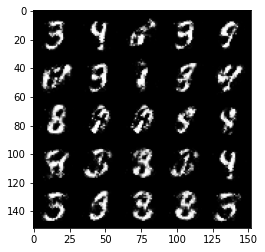

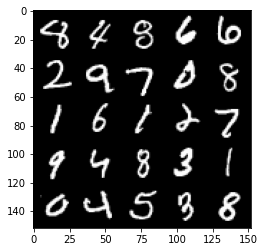

Step 30500: Generator loss: 2.790806324481962, discriminator loss: 0.23716484868526447


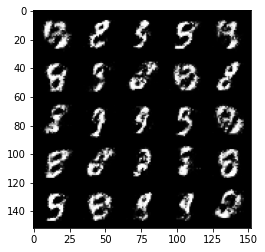

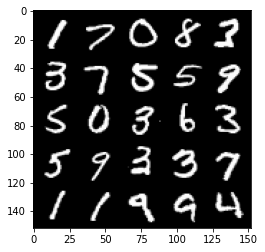

Step 31000: Generator loss: 3.0339315929412844, discriminator loss: 0.20626814508438107


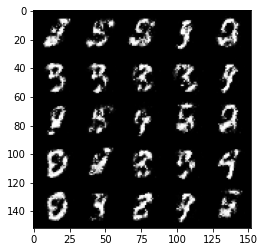

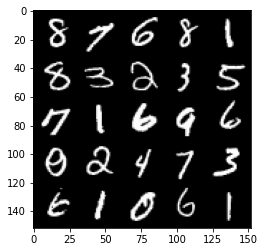

Step 31500: Generator loss: 2.8216161055564895, discriminator loss: 0.2313811905086041


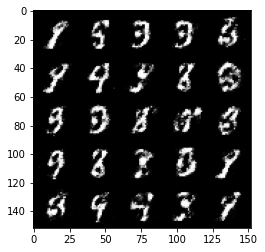

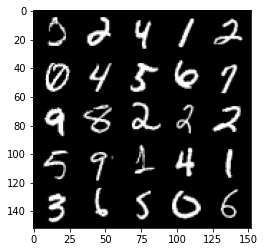

Step 32000: Generator loss: 2.715342444896698, discriminator loss: 0.2341599824428558


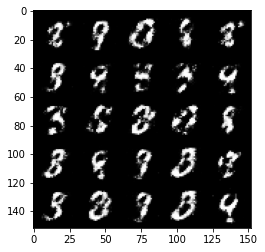

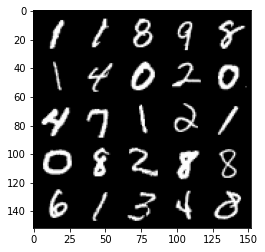

Step 32500: Generator loss: 2.752888819217684, discriminator loss: 0.21814494857192016


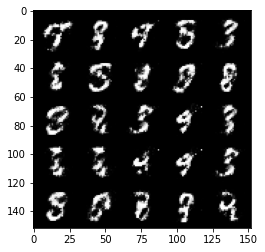

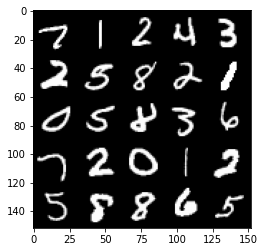

Step 33000: Generator loss: 2.700183237552644, discriminator loss: 0.2397199586629868


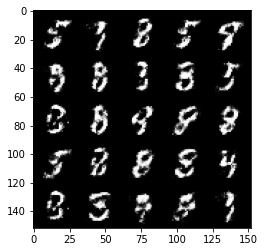

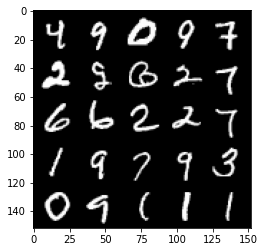

Step 33500: Generator loss: 2.773525644779204, discriminator loss: 0.23095975638926056


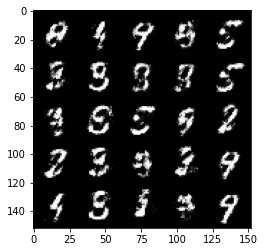

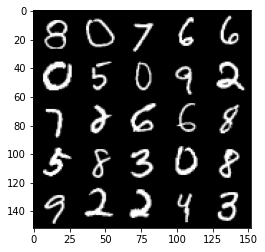

Step 34000: Generator loss: 2.780979894638062, discriminator loss: 0.22681261730194086


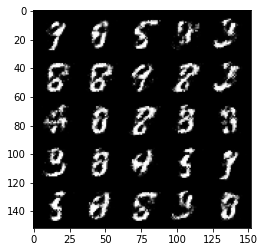

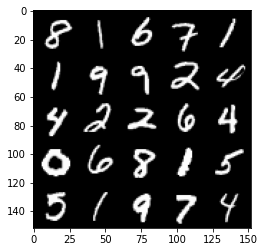

Step 34500: Generator loss: 2.6707317404746997, discriminator loss: 0.24894311195611962


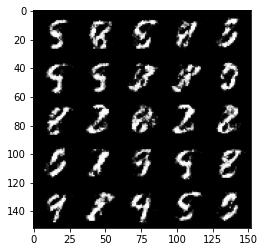

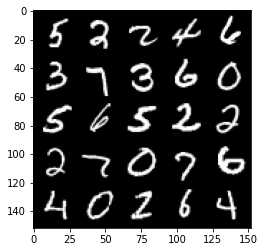

Step 35000: Generator loss: 2.706875812530516, discriminator loss: 0.23221283289790126


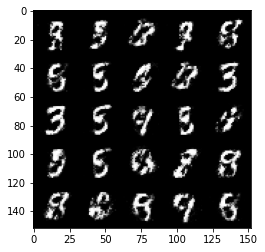

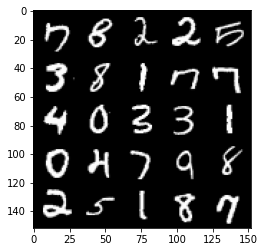

Step 35500: Generator loss: 2.583384728670121, discriminator loss: 0.26923320800066003


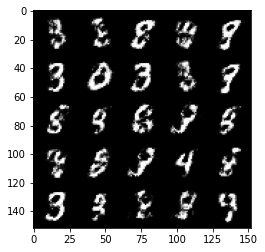

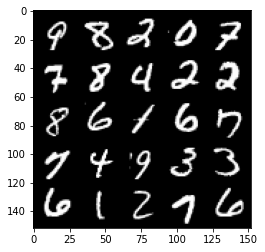

Step 36000: Generator loss: 2.4773006772995014, discriminator loss: 0.27292965158820176


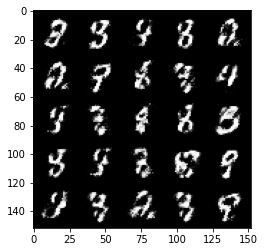

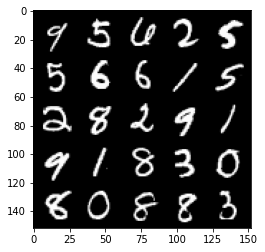

Step 36500: Generator loss: 2.643985376119615, discriminator loss: 0.2476683982610703


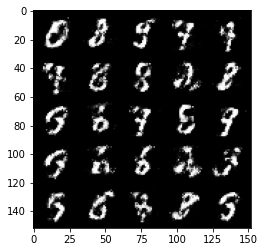

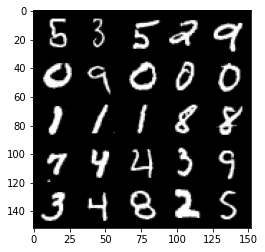

Step 37000: Generator loss: 2.529141011953357, discriminator loss: 0.28477582839131355


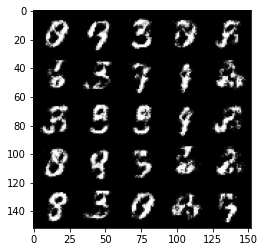

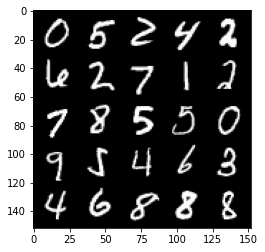

Step 37500: Generator loss: 2.437823043346404, discriminator loss: 0.3059566050469875


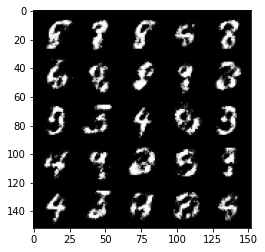

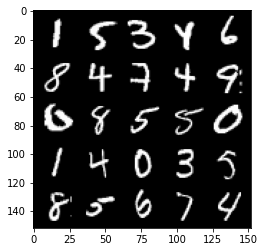

Step 38000: Generator loss: 2.371279979228974, discriminator loss: 0.3008325195014477


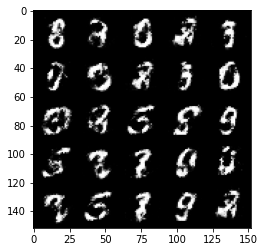

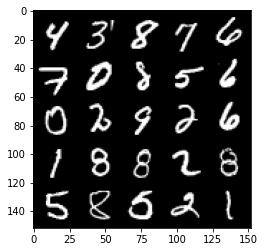

Step 38500: Generator loss: 2.5563891677856407, discriminator loss: 0.24953907650709167


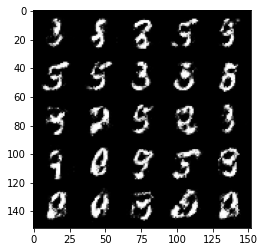

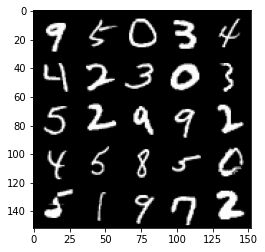

Step 39000: Generator loss: 2.3682067768573747, discriminator loss: 0.3020305143892767


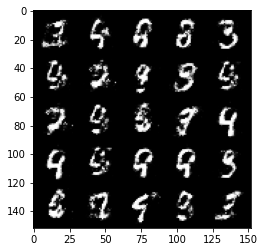

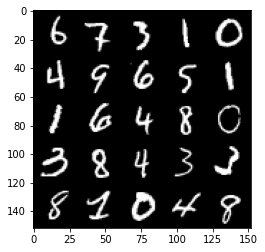

Step 39500: Generator loss: 2.336742025613784, discriminator loss: 0.2988653722107412


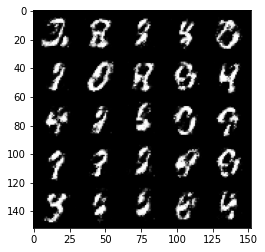

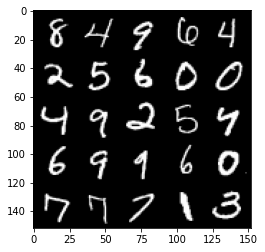

Step 40000: Generator loss: 2.3175542864799494, discriminator loss: 0.27536812922358495


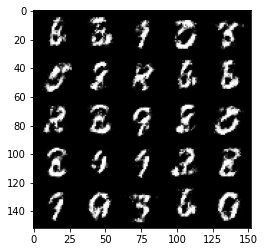

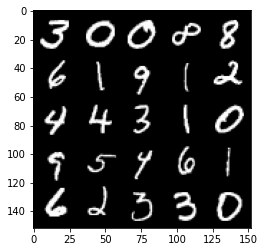

Step 40500: Generator loss: 2.3559861960411066, discriminator loss: 0.29138769271969794


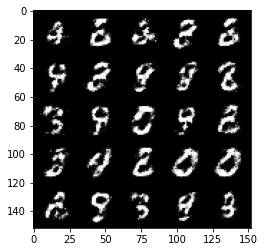

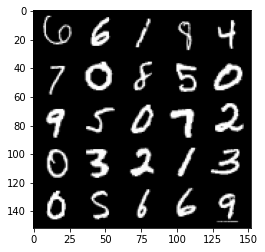

Step 41000: Generator loss: 2.3158019828796372, discriminator loss: 0.2847909969985486


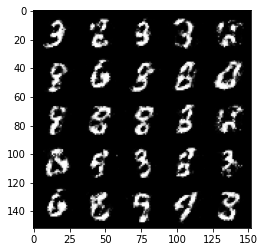

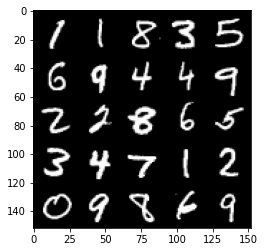

Step 41500: Generator loss: 2.323947544813156, discriminator loss: 0.2986555252373218


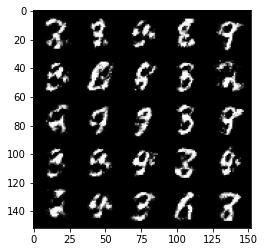

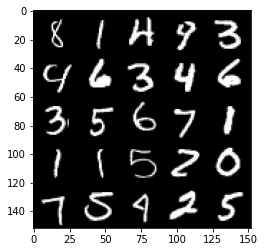

Step 42000: Generator loss: 2.2847416508197784, discriminator loss: 0.2896338221728802


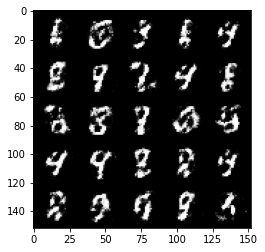

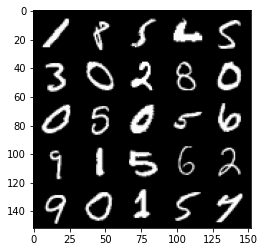

Step 42500: Generator loss: 2.225511059284213, discriminator loss: 0.30113862910866723


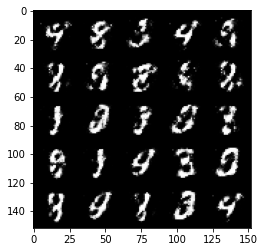

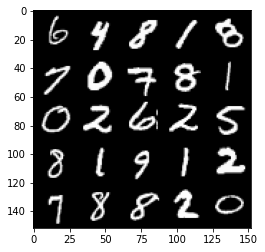

Step 43000: Generator loss: 2.2333999314308173, discriminator loss: 0.2963863231837749


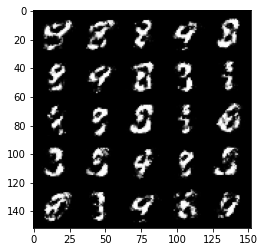

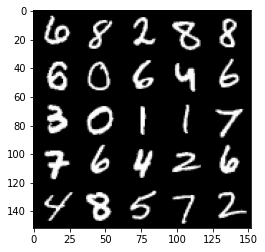

Step 43500: Generator loss: 2.2389558608531943, discriminator loss: 0.2932290097773075


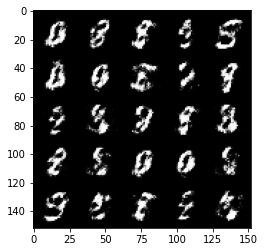

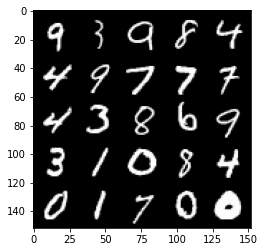

Step 44000: Generator loss: 2.262255633592604, discriminator loss: 0.3061514001488684


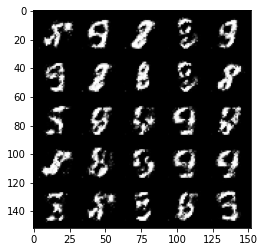

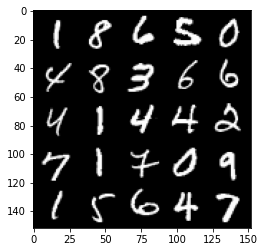

Step 44500: Generator loss: 2.2024065916538214, discriminator loss: 0.31720104563236284


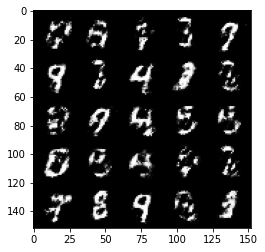

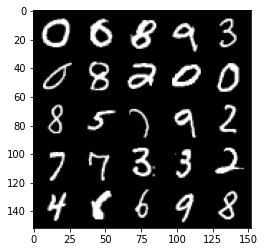

Step 45000: Generator loss: 2.22923586678505, discriminator loss: 0.3039679193794729


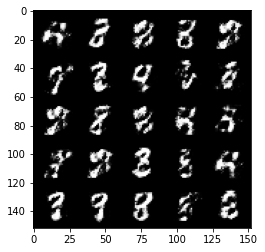

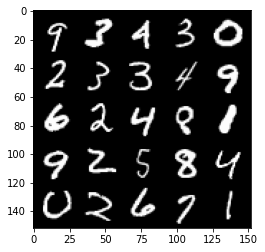

Step 45500: Generator loss: 2.206499144077302, discriminator loss: 0.3004252385795119


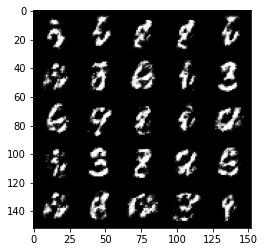

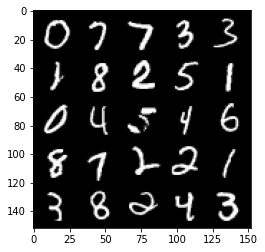

Step 46000: Generator loss: 2.238356188774111, discriminator loss: 0.3039296625852587


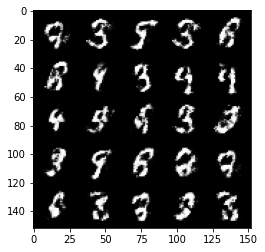

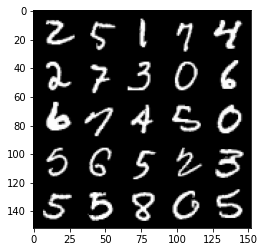

Step 46500: Generator loss: 2.1347243912220004, discriminator loss: 0.3113514009714128


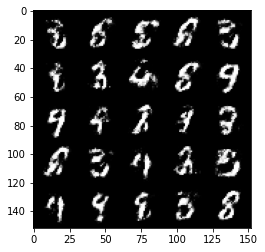

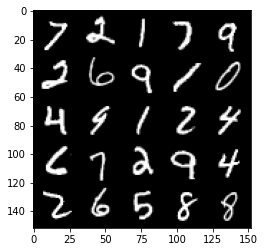

Step 47000: Generator loss: 2.08738160777092, discriminator loss: 0.3203544985055919


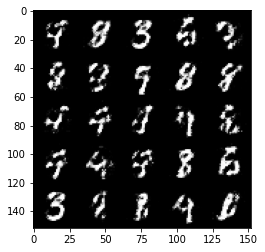

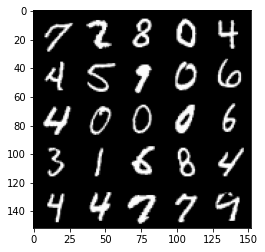

Step 47500: Generator loss: 1.9741884479522722, discriminator loss: 0.35223636198043806


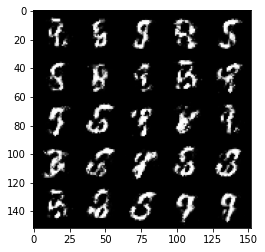

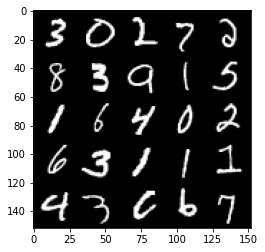

Step 48000: Generator loss: 2.0872911181449885, discriminator loss: 0.3261131967008111


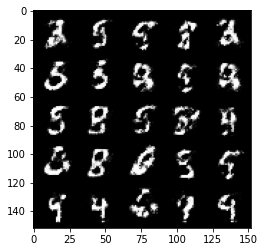

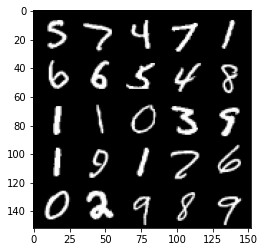

Step 48500: Generator loss: 2.024629479169846, discriminator loss: 0.3382569769620896


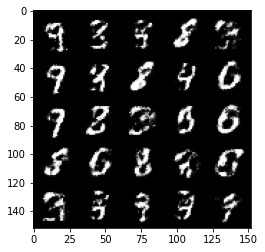

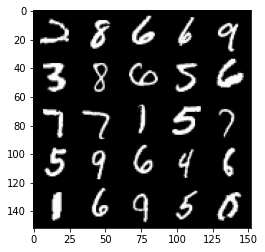

Step 49000: Generator loss: 2.0002570726871487, discriminator loss: 0.3456770068109033


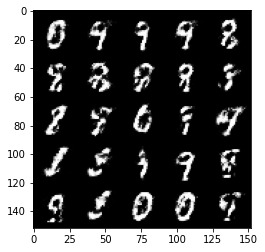

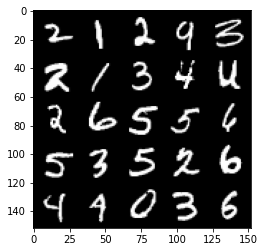

Step 49500: Generator loss: 2.0018957808017728, discriminator loss: 0.3385054081678389


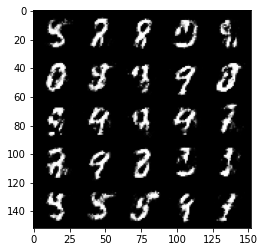

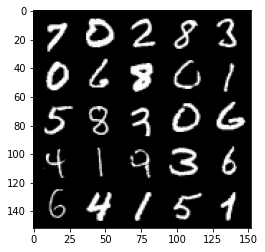

Step 50000: Generator loss: 1.9475744981765741, discriminator loss: 0.362003047525883


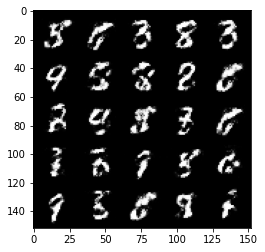

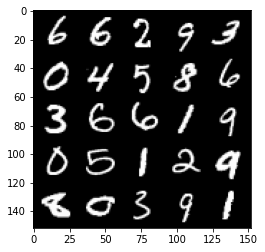

Step 50500: Generator loss: 1.9573694789409641, discriminator loss: 0.36298235604167


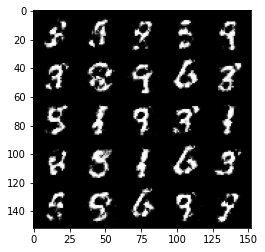

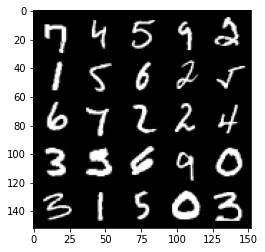

Step 51000: Generator loss: 1.944297822237014, discriminator loss: 0.36901598069071784


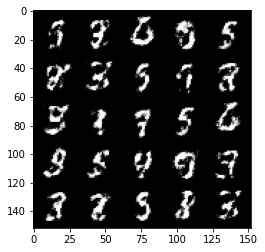

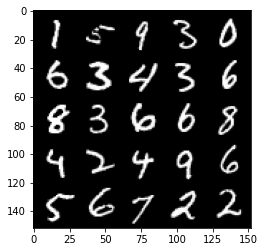

Step 51500: Generator loss: 1.9182680649757389, discriminator loss: 0.37669562840461746


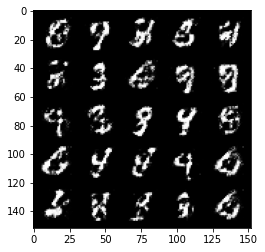

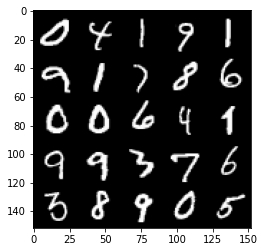

Step 52000: Generator loss: 1.8327110085487357, discriminator loss: 0.39679900372028365


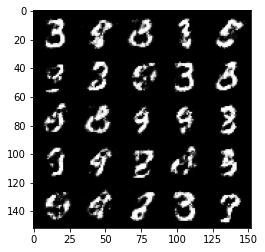

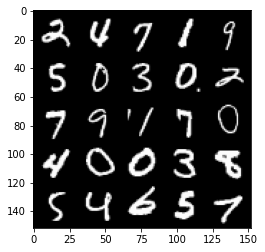

Step 52500: Generator loss: 1.9075830552577961, discriminator loss: 0.367782896578312


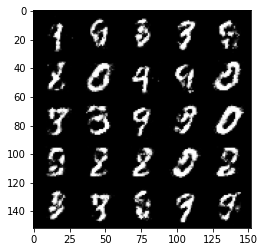

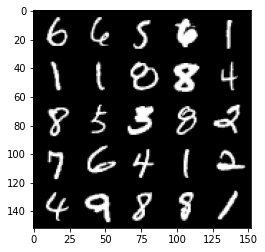

Step 53000: Generator loss: 1.899895180940629, discriminator loss: 0.36841790109872813


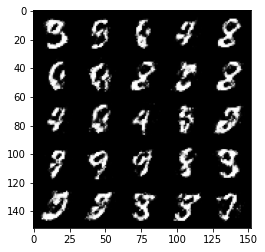

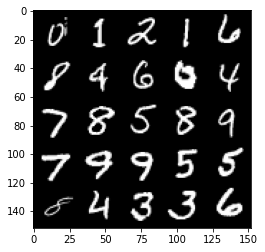

Step 53500: Generator loss: 1.9680801541805257, discriminator loss: 0.337561401516199


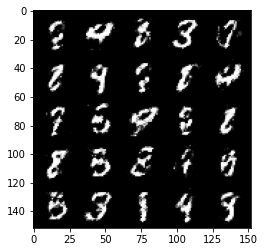

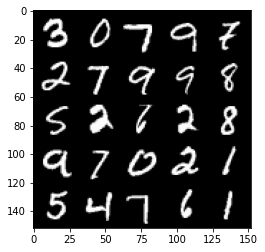

Step 54000: Generator loss: 1.9340481903553006, discriminator loss: 0.3588743299245834


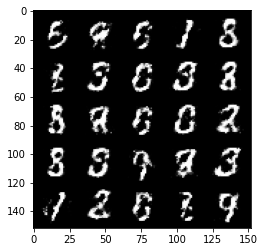

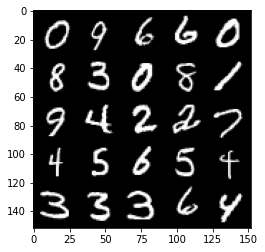

Step 54500: Generator loss: 1.8585908098220814, discriminator loss: 0.3619954859614374


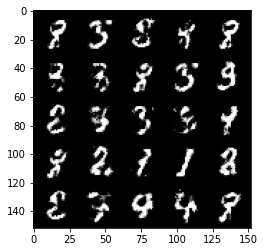

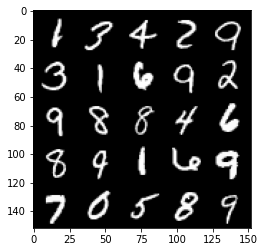

Step 55000: Generator loss: 1.9320578434467317, discriminator loss: 0.35707708996534354


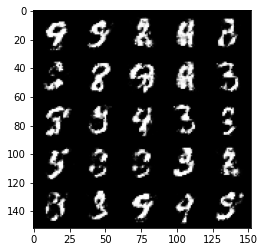

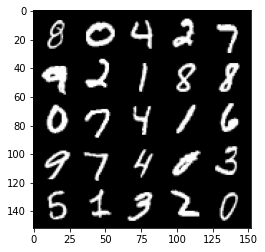

Step 55500: Generator loss: 1.90954026389122, discriminator loss: 0.3482172527015213


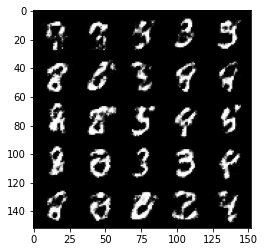

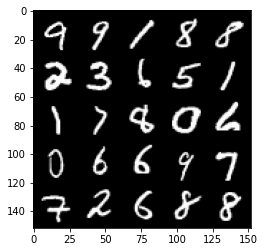

Step 56000: Generator loss: 1.926666026830674, discriminator loss: 0.3458802958726884


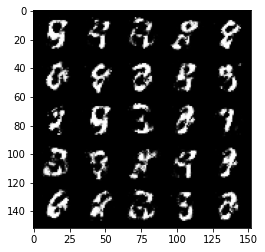

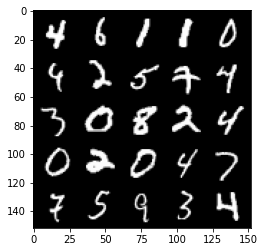

Step 56500: Generator loss: 1.9948362035751341, discriminator loss: 0.32826080802082985


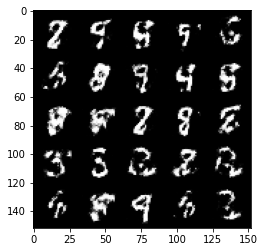

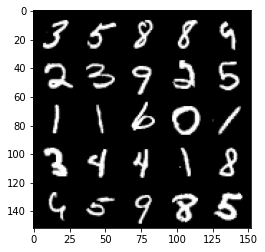

Step 57000: Generator loss: 1.9341550765037532, discriminator loss: 0.3538115200400353


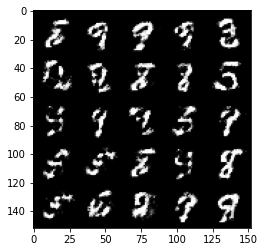

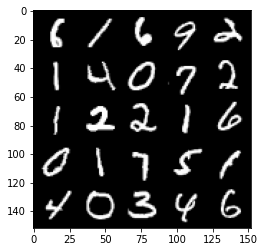

Step 57500: Generator loss: 1.8476791112422941, discriminator loss: 0.36187221807241415


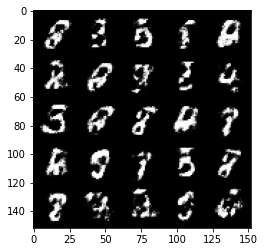

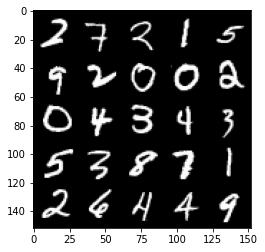

Step 58000: Generator loss: 1.9352400000095389, discriminator loss: 0.33231613233685475


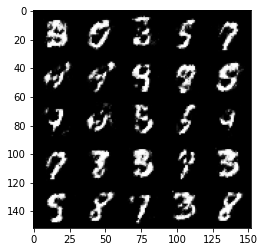

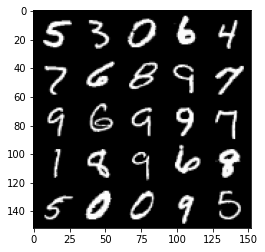

Step 58500: Generator loss: 1.8574229042530064, discriminator loss: 0.3617075369954109


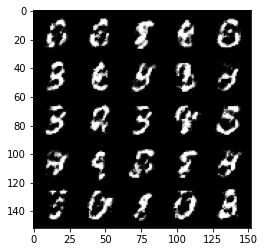

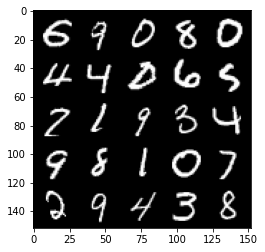

Step 59000: Generator loss: 1.7813973934650413, discriminator loss: 0.385678121447563


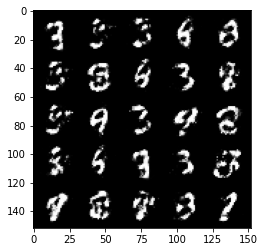

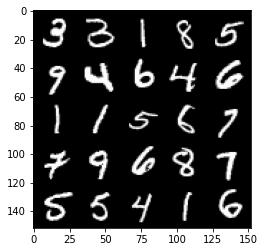

Step 59500: Generator loss: 1.824074002742767, discriminator loss: 0.38253209492564183


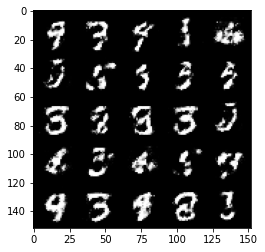

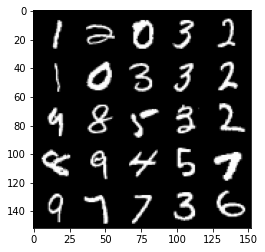

Step 60000: Generator loss: 1.8614264352321608, discriminator loss: 0.36547160106897375


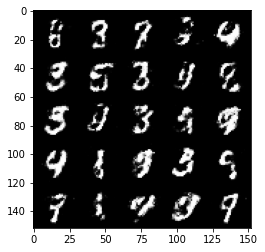

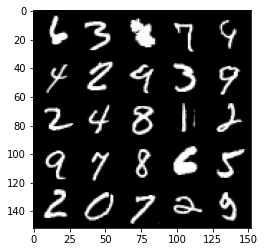

Step 60500: Generator loss: 1.8050734829902662, discriminator loss: 0.36425623512268085


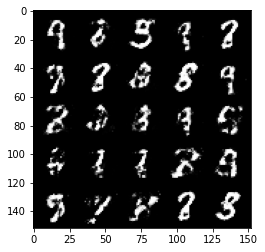

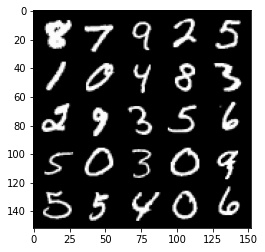

Step 61000: Generator loss: 1.875182667970657, discriminator loss: 0.34806682956218726


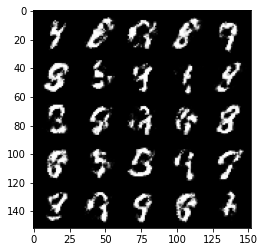

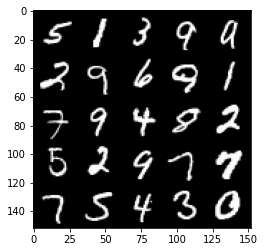

Step 61500: Generator loss: 1.8041148777008056, discriminator loss: 0.3704683875441553


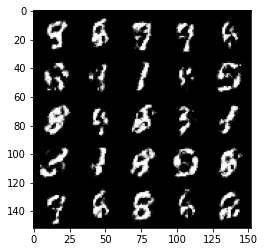

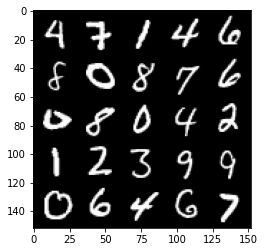

Step 62000: Generator loss: 1.7206945042610162, discriminator loss: 0.4102684870958334


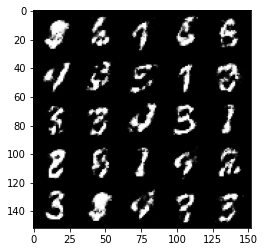

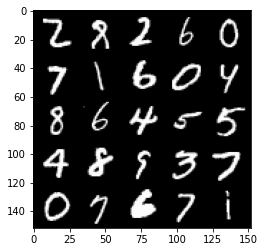

Step 62500: Generator loss: 1.6591312034130092, discriminator loss: 0.4140811672806743


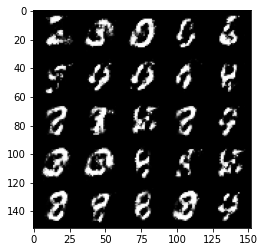

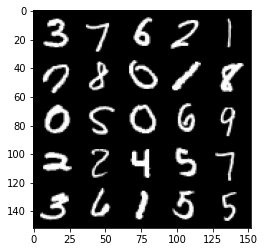

Step 63000: Generator loss: 1.6249446856975556, discriminator loss: 0.4281321616768833


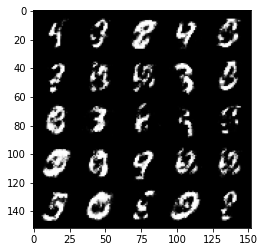

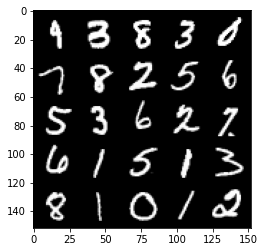

Step 63500: Generator loss: 1.5748016545772536, discriminator loss: 0.44004352742433545


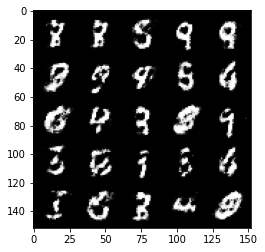

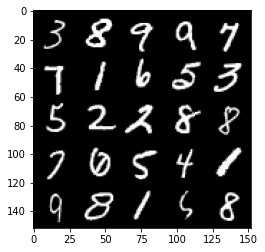

Step 64000: Generator loss: 1.6269786634445185, discriminator loss: 0.4078875145912165


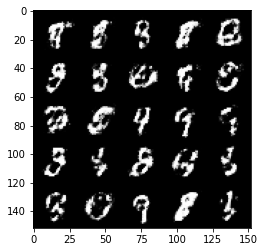

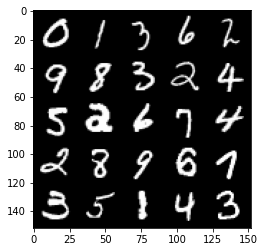

Step 64500: Generator loss: 1.6603101460933685, discriminator loss: 0.4103536275029183


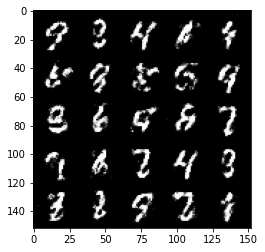

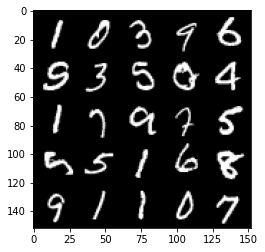

Step 65000: Generator loss: 1.6655118570327743, discriminator loss: 0.4065895351171495


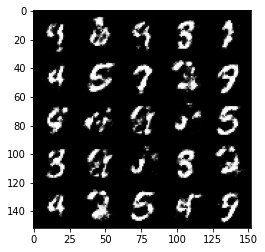

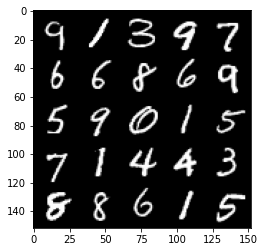

Step 65500: Generator loss: 1.6602049438953401, discriminator loss: 0.3985655279755595


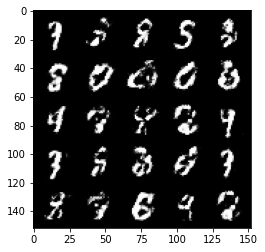

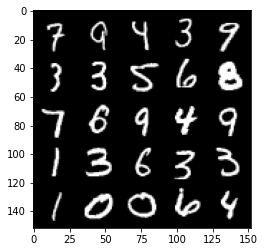

Step 66000: Generator loss: 1.6619942126274099, discriminator loss: 0.3935636915564538


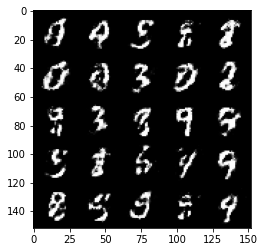

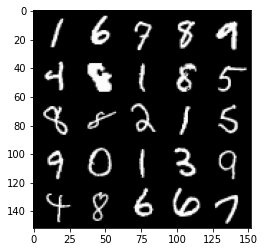

Step 66500: Generator loss: 1.6256877782344807, discriminator loss: 0.41452388525009165


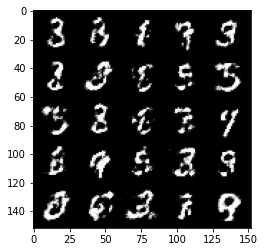

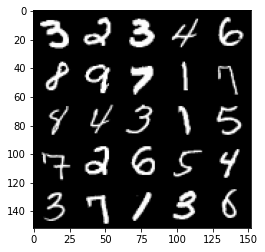

Step 67000: Generator loss: 1.601379652500152, discriminator loss: 0.4247080059051518


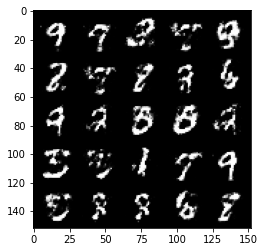

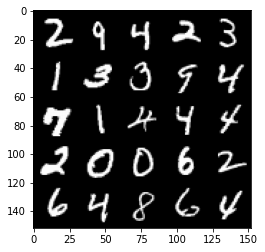

Step 67500: Generator loss: 1.6305699760913854, discriminator loss: 0.39865394514799185


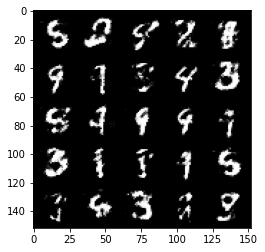

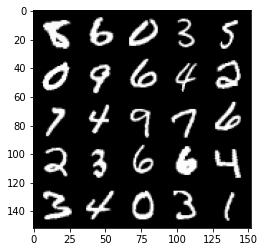

Step 68000: Generator loss: 1.598824502468109, discriminator loss: 0.4111228086948396


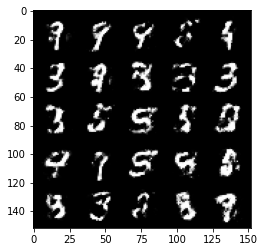

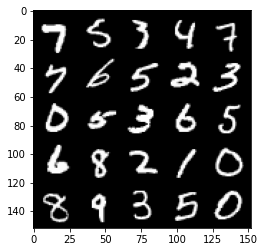

Step 68500: Generator loss: 1.633229295730591, discriminator loss: 0.39678313392400705


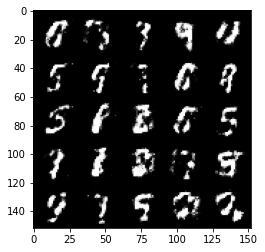

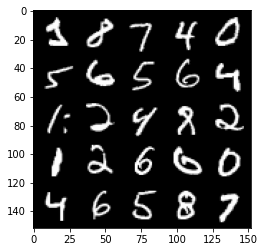

Step 69000: Generator loss: 1.6563368499279025, discriminator loss: 0.3900277966856954


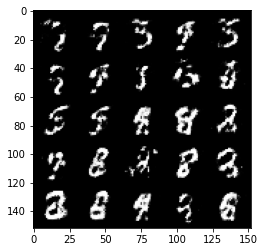

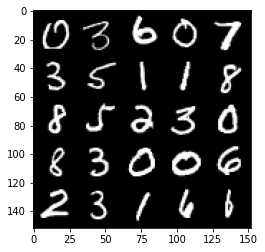

Step 69500: Generator loss: 1.5861308121681208, discriminator loss: 0.4150884332060813


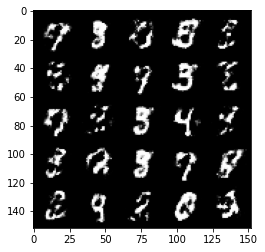

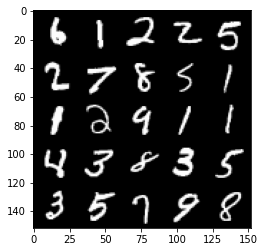

Step 70000: Generator loss: 1.6121796553134917, discriminator loss: 0.41809378606081016


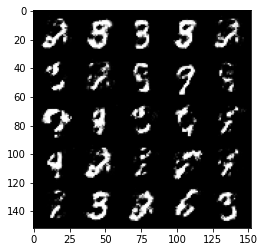

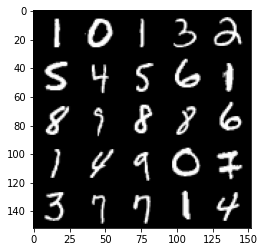

Step 70500: Generator loss: 1.7112611300945297, discriminator loss: 0.3887421524524689


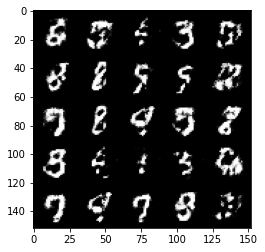

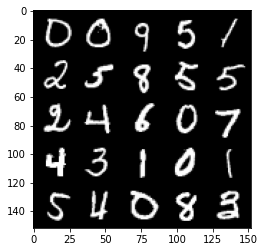

Step 71000: Generator loss: 1.711973208665849, discriminator loss: 0.38936205327510837


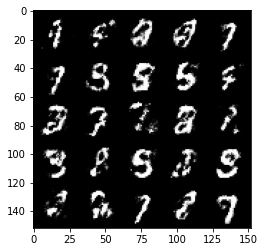

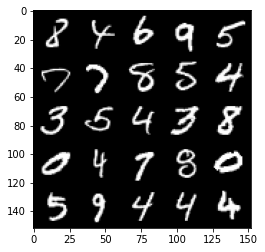

Step 71500: Generator loss: 1.6518214929103854, discriminator loss: 0.40749650883674604


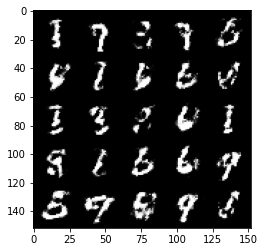

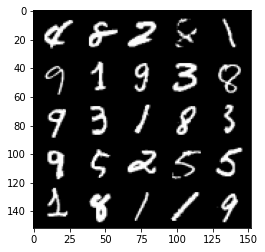

Step 72000: Generator loss: 1.5719805169105523, discriminator loss: 0.4229146844744681


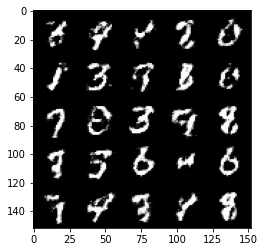

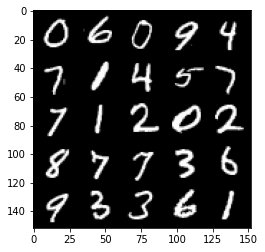

Step 72500: Generator loss: 1.560576455831528, discriminator loss: 0.4287156476378441


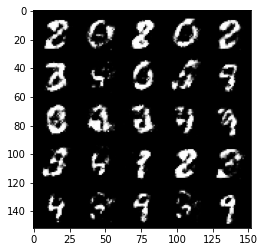

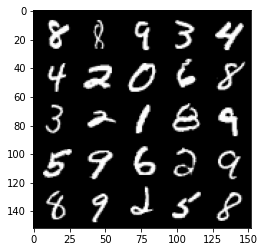

Step 73000: Generator loss: 1.5518362998962412, discriminator loss: 0.4386848271489145


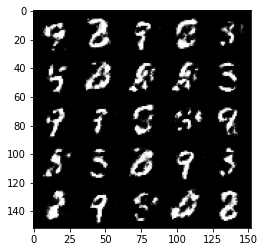

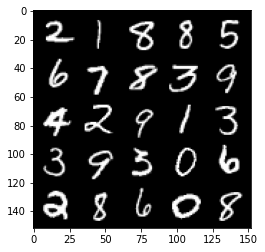

Step 73500: Generator loss: 1.6108620259761817, discriminator loss: 0.4039678773283956


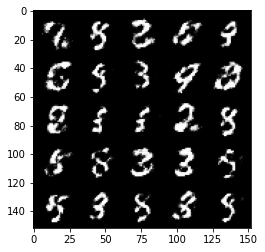

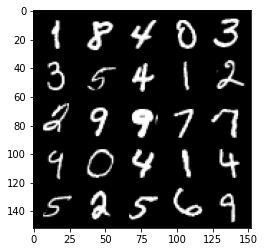

Step 74000: Generator loss: 1.5545228977203362, discriminator loss: 0.4331579540371894


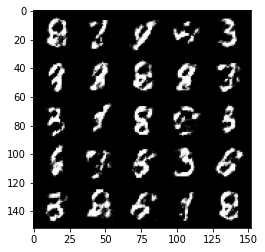

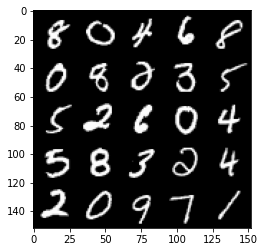

Step 74500: Generator loss: 1.4789832003116627, discriminator loss: 0.46823703980445885


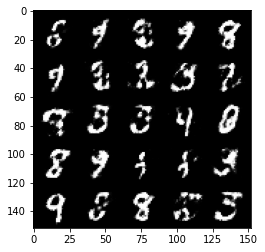

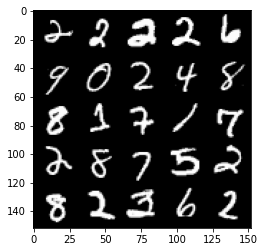

Step 75000: Generator loss: 1.4737204658985141, discriminator loss: 0.45876622456312205


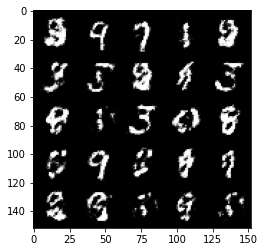

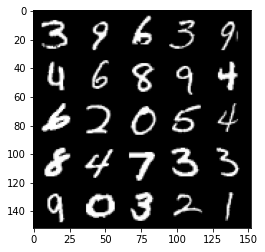

Step 75500: Generator loss: 1.4873122401237482, discriminator loss: 0.4390036740303038


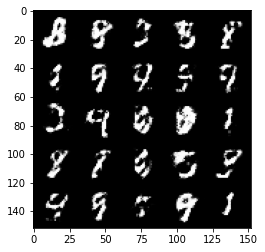

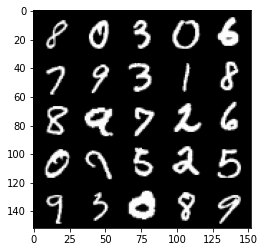

Step 76000: Generator loss: 1.551753474712372, discriminator loss: 0.4195166213512424


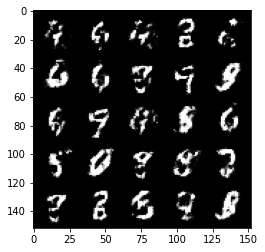

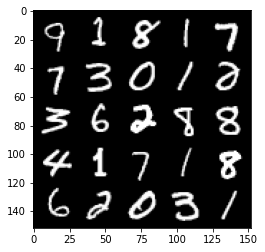

Step 76500: Generator loss: 1.4726074273586278, discriminator loss: 0.459792654335499


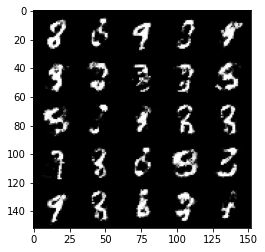

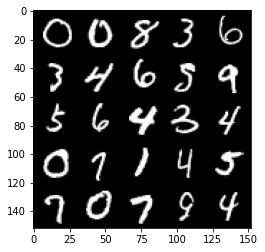

Step 77000: Generator loss: 1.5397723441123965, discriminator loss: 0.4266302863359449


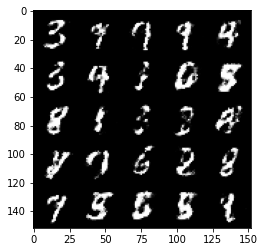

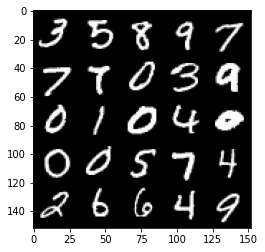

Step 77500: Generator loss: 1.5350896811485315, discriminator loss: 0.4226326584219933


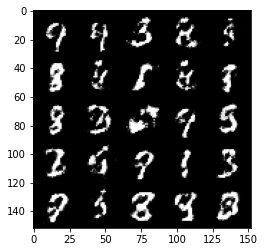

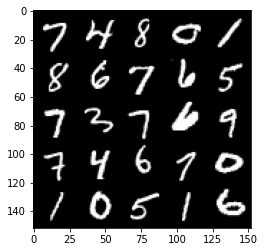

Step 78000: Generator loss: 1.455593145132064, discriminator loss: 0.44881755888462066


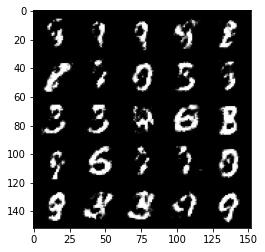

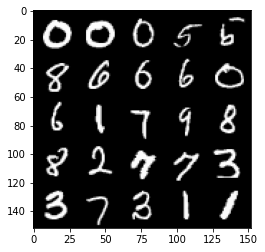

Step 78500: Generator loss: 1.5288878200054168, discriminator loss: 0.4313191429376598


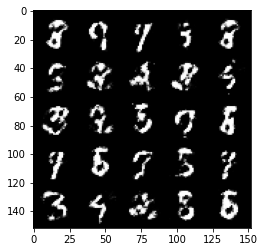

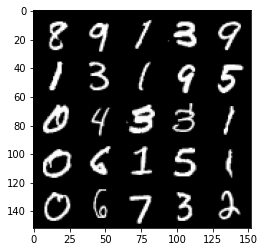

Step 79000: Generator loss: 1.532355674028396, discriminator loss: 0.4343519753813744


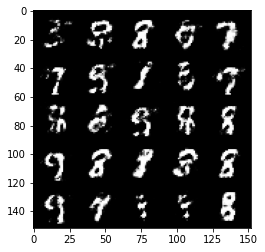

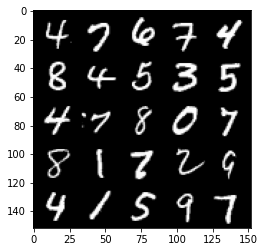

Step 79500: Generator loss: 1.4566831378936762, discriminator loss: 0.45675466668605813


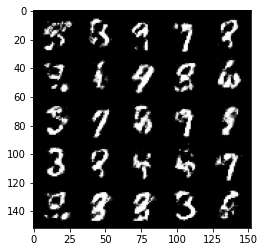

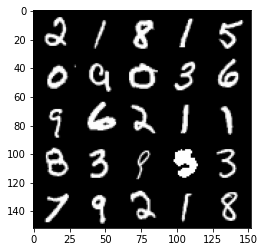

Step 80000: Generator loss: 1.437393741846086, discriminator loss: 0.45988279867172255


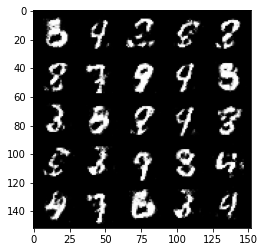

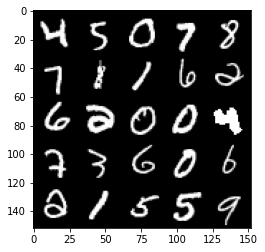

Step 80500: Generator loss: 1.4709681532382968, discriminator loss: 0.43786136853694924


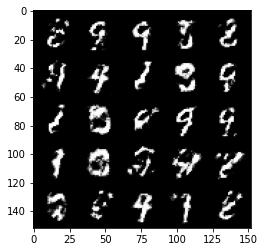

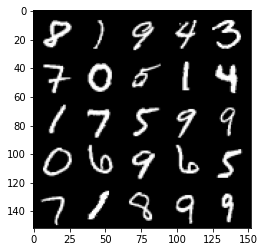

Step 81000: Generator loss: 1.4963832762241387, discriminator loss: 0.43126372021436693


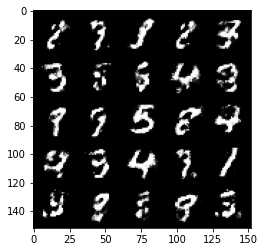

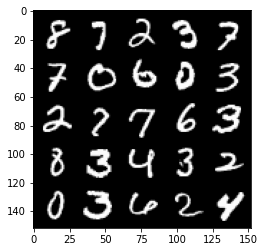

Step 81500: Generator loss: 1.4855853676795963, discriminator loss: 0.4457555980682373


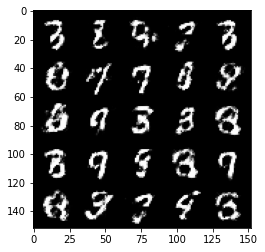

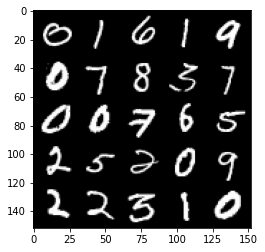

Step 82000: Generator loss: 1.4526180975437164, discriminator loss: 0.4523505520224575


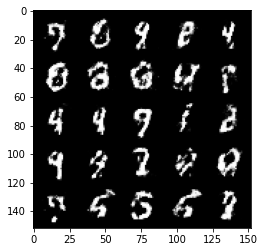

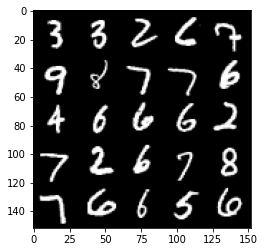

Step 82500: Generator loss: 1.4032584753036483, discriminator loss: 0.46155055111646626


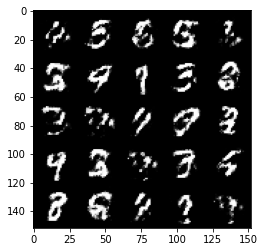

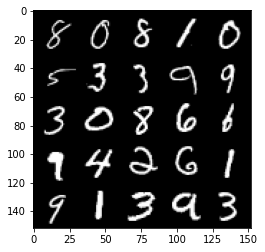

Step 83000: Generator loss: 1.502287786006926, discriminator loss: 0.4319211770892142


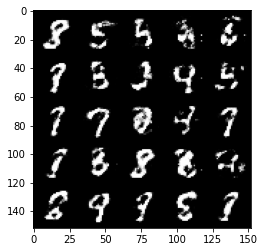

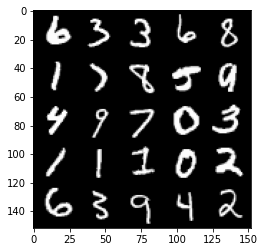

Step 83500: Generator loss: 1.4476258165836349, discriminator loss: 0.44840336221456517


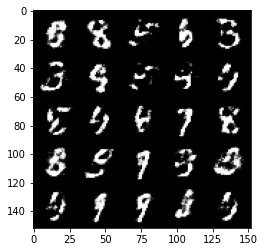

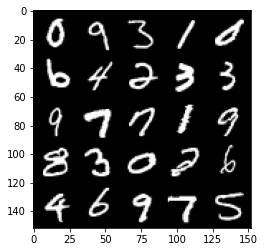

Step 84000: Generator loss: 1.3442539479732505, discriminator loss: 0.495923611402512


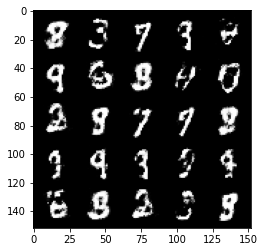

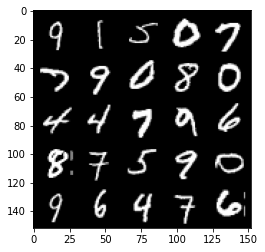

Step 84500: Generator loss: 1.3423263578414901, discriminator loss: 0.47984721100330363


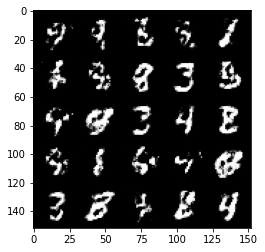

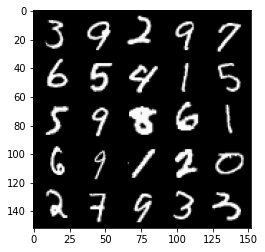

Step 85000: Generator loss: 1.3917973144054416, discriminator loss: 0.45588563364744183


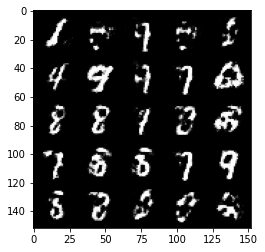

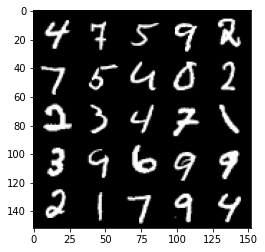

Step 85500: Generator loss: 1.3411403620243074, discriminator loss: 0.4765767389535903


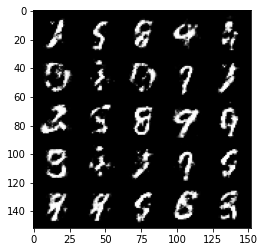

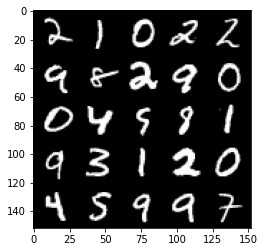

Step 86000: Generator loss: 1.3219336535930637, discriminator loss: 0.4854579200148585


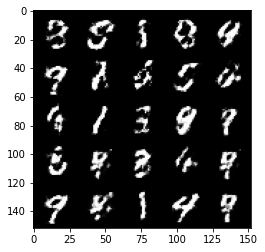

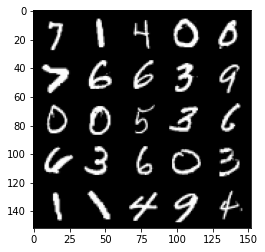

Step 86500: Generator loss: 1.3889996094703674, discriminator loss: 0.4651223013997078


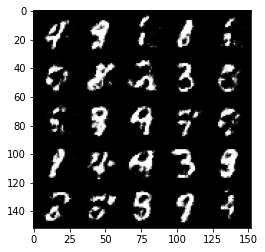

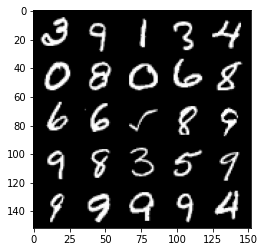

Step 87000: Generator loss: 1.3667527534961712, discriminator loss: 0.4590990481376647


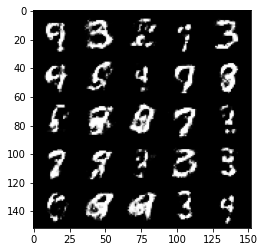

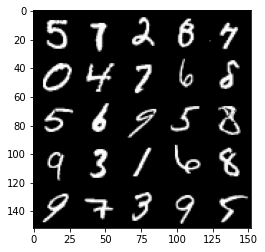

Step 87500: Generator loss: 1.4060485134124747, discriminator loss: 0.4447745671272276


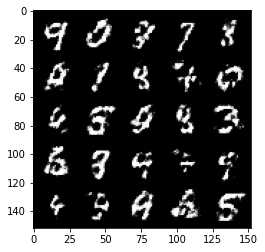

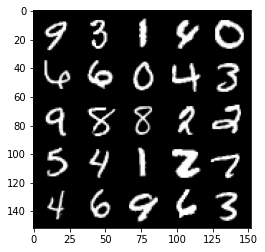

Step 88000: Generator loss: 1.4564695034027089, discriminator loss: 0.4420375061631201


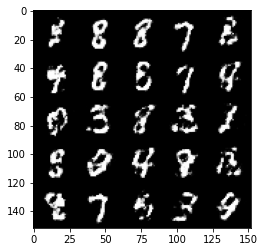

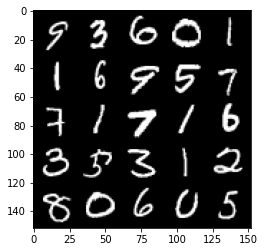

Step 88500: Generator loss: 1.3860501530170446, discriminator loss: 0.4710499071478841


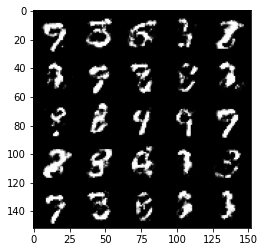

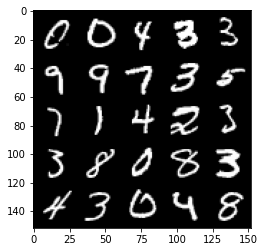

Step 89000: Generator loss: 1.3417690272331224, discriminator loss: 0.483917061030865


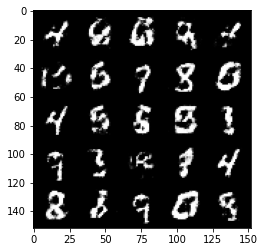

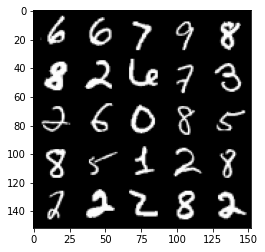

Step 89500: Generator loss: 1.3522098312377933, discriminator loss: 0.4708720496892931


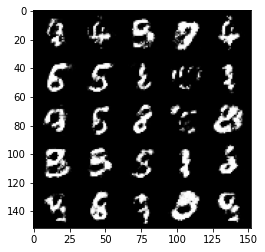

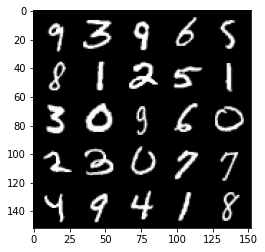

Step 90000: Generator loss: 1.3051392626762393, discriminator loss: 0.49328691780567163


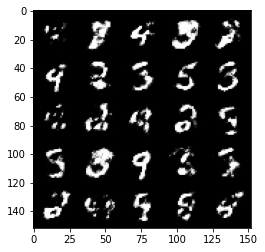

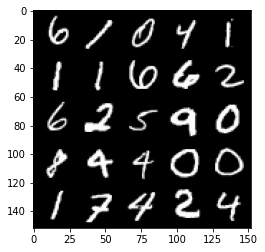

Step 90500: Generator loss: 1.3487182211875917, discriminator loss: 0.4598665177822115


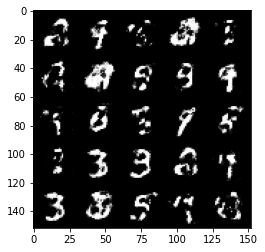

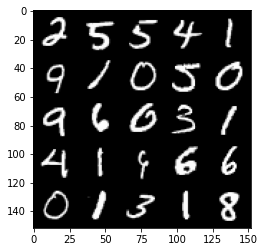

Step 91000: Generator loss: 1.3295217640399928, discriminator loss: 0.46722390359640054


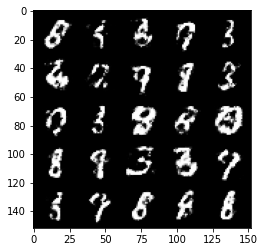

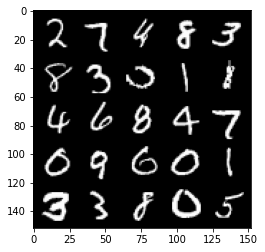

Step 91500: Generator loss: 1.3328982355594632, discriminator loss: 0.4707890367507932


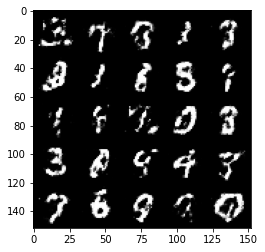

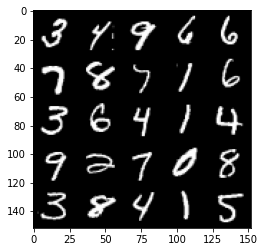

Step 92000: Generator loss: 1.3160487091541284, discriminator loss: 0.47673250907659515


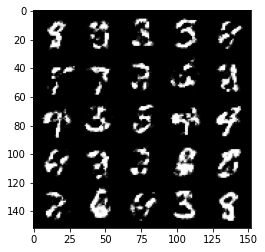

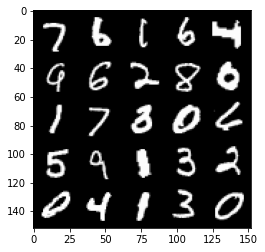

Step 92500: Generator loss: 1.3675283215045928, discriminator loss: 0.4701624274849891


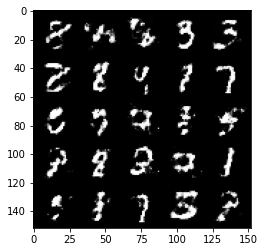

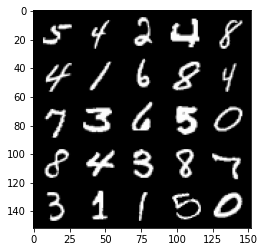

Step 93000: Generator loss: 1.3367499625682822, discriminator loss: 0.4877322255373003


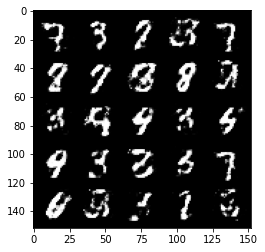

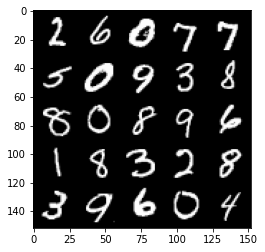

Step 93500: Generator loss: 1.437334376096724, discriminator loss: 0.44543404656648616


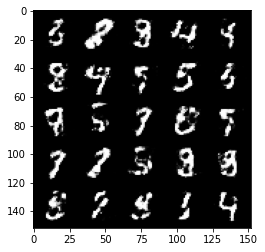

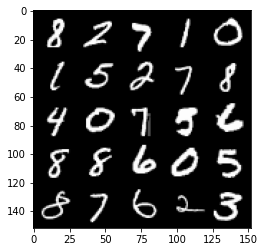

In [46]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**